# Hi-res (eyelink) eye-tracker reprocessing: BINOCULAR DATA

In [1]:
import sys
import os
import h5py 

# setup paths
iteration = 1 # which version of this tutorial to run (in case want results in different dirs)
NBname = 'color_cloud_initial{}'.format(iteration)

myhost = os.uname()[1] # get name of machine
print("Running on Computer: [%s]" %myhost)

if myhost=='hoser':
    sys.path.insert(0, '/Users/dbutts/')
    dirname = os.path.join('.', 'checkpoints')
    datadir = '/Users/dbutts/V1/Conway/'
else:
    sys.path.insert(0, '/home/felixbartsch/Code/') 
    datadir = '/Data/FelixData/Conway/'  
    dirname = '/home/felixbartsch/Data/Colorworkspace/' # Working directory 

import numpy as np
import scipy.io as sio
from copy import deepcopy

# plotting
import matplotlib.pyplot as plt

# Import torch
import torch
from torch import nn

# NDN tools
import NDNT.utils as utils # some other utilities
import NDNT.NDNT as NDN
from NDNT.modules.layers import *
from NDNT.networks import *
from time import time

import ColorDataUtils.ConwayUtils as CU 

#device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
#dtype = torch.float32

# Where saved models and checkpoints go -- this is to be automated
print( 'Save_dir =', dirname)

%load_ext autoreload
%autoreload 2

Running on Computer: [m1]
Invoking __init__.py for NDNT.utils
Save_dir = /home/felixbartsch/Data/Colorworkspace/


In [2]:
fndate= '0711'
print(fndate)
#local data structs
dirname2 = dirname+fndate+'/'
dirname_mod = dirname+fndate+'/models/'

#data directory structs
PROOT = 'J22'+fndate
fn = PROOT+'_CC_CC'
fn0 = fn+'_v08'

datadir2 = datadir+'proc/'+PROOT+'/'
analdir = datadir+'analysis/'+PROOT+'/'
moddir = datadir+'models/'+PROOT+'/'

0711


In [3]:
f = h5py.File(os.path.join(datadir2, fn0+'.mat'), 'r')

ETtrace = np.array(f['ETtrace'], dtype=np.float32)
ETraw = np.array(f['ETtrace_raw'], dtype=np.float32)
blk_inds = np.array(f['block_inds'], dtype=int)-1
sacc_inds = np.array(f['sacc_inds'], dtype=int)-1
useL = np.array(f['useLeye']) 
useR = np.array(f['useReye']) 
f.close()
print(len(ETraw), len(ETtrace))
T = 4000

4236000 254160


In [4]:
ETraw.shape

(4236000, 4)

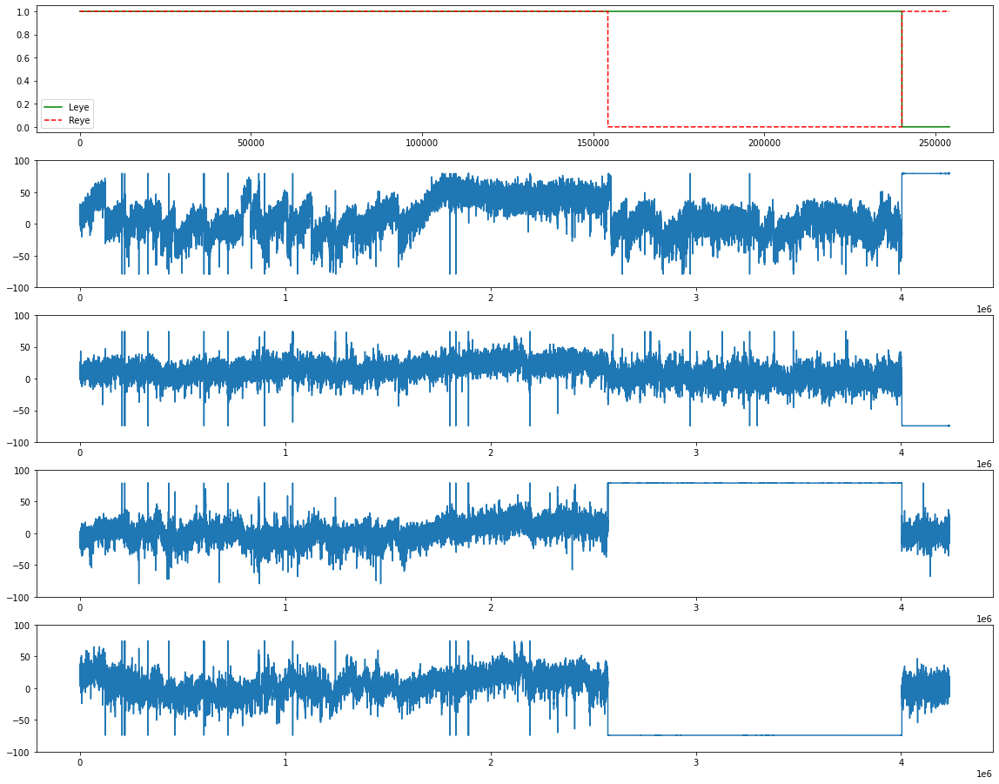

In [6]:
utils.ss(5,1)
plt.subplot(5,1,1)
plt.plot(useL,'g')
plt.plot(useR,'r--')
plt.legend(['Leye', 'Reye'])
for ii in range(4):
    plt.subplot(5,1,ii+2)
    plt.plot(ETraw[:,ii])
    plt.ylim([-100,100])
plt.show()

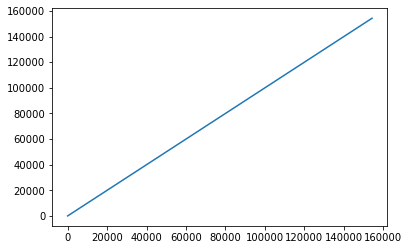

In [7]:
plt.plot(np.where((useL > 0) & (useR > 0))[0])

In [8]:
Leyefirst=False # True if the first two lines blank out first, or t3[0]>t2[0]
Binocsplit=False

In [15]:
tB = np.where((useL > 0) & (useR > 0))[0]
tR = np.where((useL < 0.5) & (useR > 0.5))[0]
tL = np.where((useL > 0.5) & (useR < 0.5))[0]

# Scale to high res: /60 and *1000
if Leyefirst:
    if Binocsplit:
        tBhr = list(range(tB[0]//6*100, (tR[0]-1)//6*100))+list(range((tL[-1]+2)//6*100, (tB[-1]+1)//6*100))
    else:
        tBhr = range(tB[0]//6*100, (tB[-1]+1)//6*100)
else:
    if Binocsplit:
        tBhr = list(range(t1[0]//6*100, (tL[0]-1)//6*100))+list(range((tR[-1]+2)//6*100, (tB[-1]+1)//6*100))
    else:
        tBhr = range(tB[0]//6*100, (tB[-1]+1)//6*100)
tRhr = range(tR[0]//6*100, (tR[-1]+1)//6*100)
tLhr = range(tL[0]//6*100, (tL[-1]+1)//6*100)


In [16]:
#Kluge for 0707:
#tBhr = range(tB[0]//6*100, (tR[0]-1)//6*100)


In [17]:
tB[0], tR[0], tL[0], tB[-1], tR[-1], tL[-1]

(0, 240240, 154320, 154319, 254159, 240239)

Mean-subtraction on dim 0: offset = 17.2
Mean-subtraction on dim 1: offset = 16.0
Mean-subtraction on dim 2: offset = 3.5
Mean-subtraction on dim 3: offset = 5.6


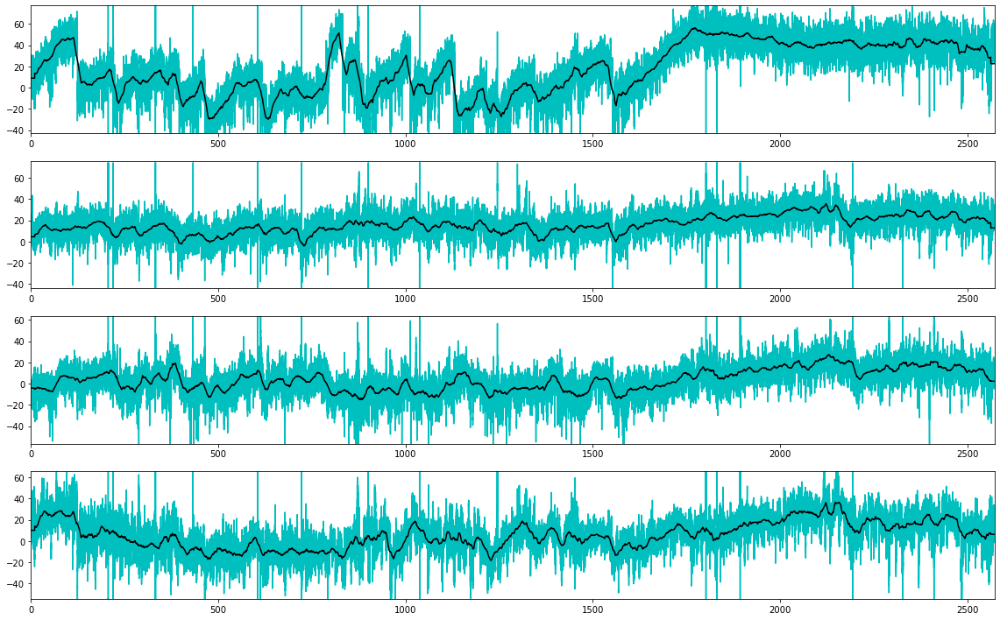

In [18]:
et1khzB1 = CU.slow_drift_correct( ETraw[tBhr, :], tau=20000 )

Mean-subtraction on dim 0: offset = 0.8
Mean-subtraction on dim 1: offset = -0.6


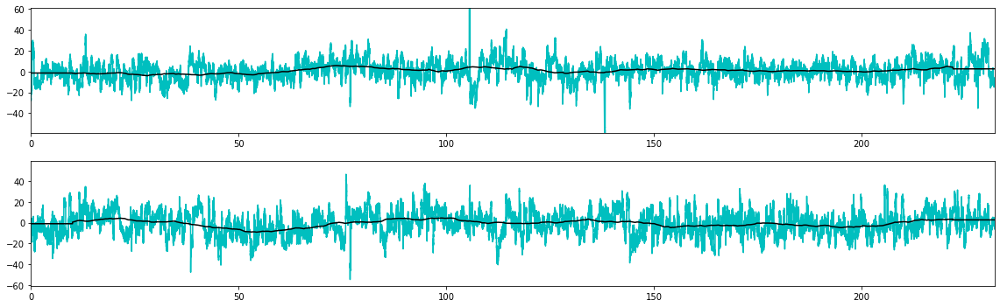

In [13]:
et1khzR1 = CU.slow_drift_correct( ETraw[tRhr, 2:], tau = 20000 ) #left eye obstructed first

Mean-subtraction on dim 0: offset = -0.7
Mean-subtraction on dim 1: offset = 1.7


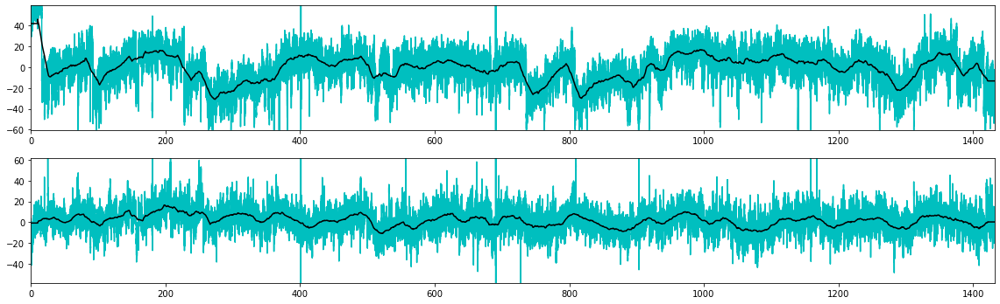

In [14]:
et1khzL1 = CU.slow_drift_correct( ETraw[tLhr, :2], tau = 20000 )  #left eye obstructed first

## Binocular processing

  76 blinks detected and zeroed
  26 blinks detected and zeroed
  3 blinks detected and zeroed


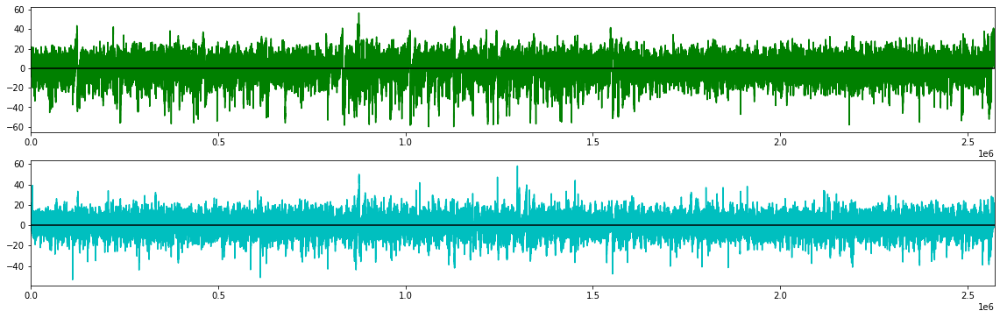

In [19]:
et1khzB, blinksB = CU.blink_process(et1khzB1, blink_thresh=60)
et1khzL, blinksL = CU.blink_process(et1khzL1, blink_thresh=60)
et1khzR, blinksR = CU.blink_process(et1khzR1, blink_thresh=60)
utils.ss(2,1)
plt.subplot(211)
plt.plot(et1khzB[:,0],'g')
plt.plot([0,et1khzB.shape[0]],[0,0],'k')
plt.xlim([0, et1khzB.shape[0]])
plt.subplot(212)
plt.plot(et1khzB[:,1],'c')
plt.plot([0,et1khzB.shape[0]],[0,0],'k')
plt.xlim([0, et1khzB.shape[0]])
plt.show()

In [20]:
# List of all potential saccade times
CsacsB, CampsB = CU.saccade_detect( et1khzB, blinks=blinksB )
CsacsR, CampsR = CU.saccade_detect( et1khzR, blinks=blinksR )
CsacsL, CampsL = CU.saccade_detect( et1khzL, blinks=blinksL )

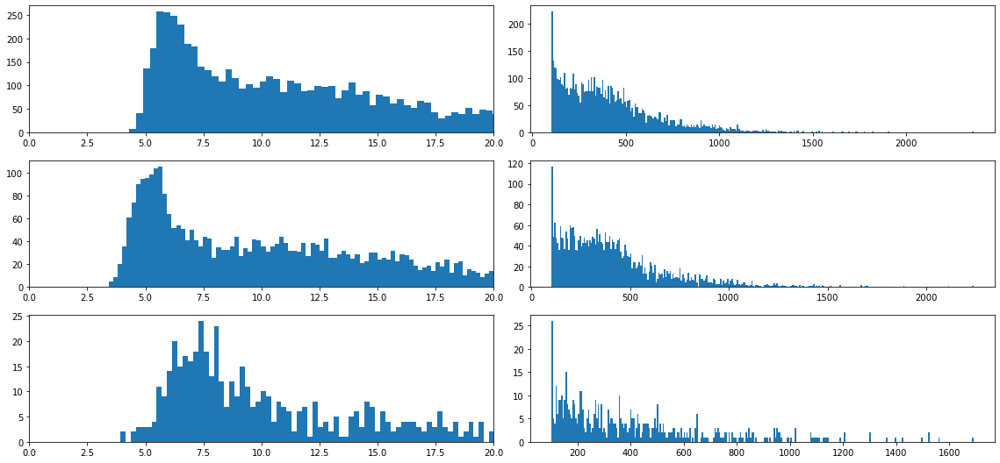

411.65  261.46
411.59  261.33
408.28  293.09


In [21]:
utils.ss(3,2)
plt.subplot(321)
a = plt.hist(np.sqrt(CampsB), bins=300)
plt.xlim([0, 20])
plt.subplot(322)
# Intersaccade interval distribution
plt.hist(np.diff(CsacsB), bins=300)
plt.subplot(323)
a = plt.hist(np.sqrt(CampsL), bins=300)
plt.xlim([0, 20])
plt.subplot(324)
plt.hist(np.diff(CsacsL), bins=300)
plt.subplot(325)
a = plt.hist(np.sqrt(CampsR), bins=300)
plt.xlim([0, 20])
plt.subplot(326)
# Intersaccade interval distribution
plt.hist(np.diff(CsacsR), bins=300)

plt.show()
print("%0.2f  %0.2f"%(np.mean(np.diff(CsacsB)), np.std(np.diff(CsacsB))))
print("%0.2f  %0.2f"%(np.mean(np.diff(CsacsL)), np.std(np.diff(CsacsL))))
print("%0.2f  %0.2f"%(np.mean(np.diff(CsacsR)), np.std(np.diff(CsacsR))))

Amplitudes: [19.513166 21.757084 23.126705  7.902654 24.154913 29.076063 35.777206
 37.997105  7.271994 14.042905]


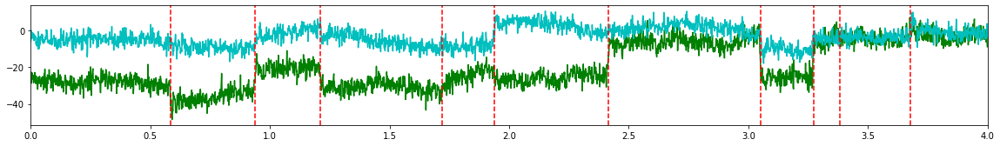

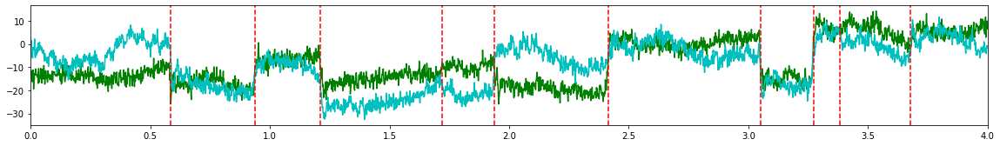

In [22]:
CU.trial_saccade_display(89, et1khzB, CsacsB, CampsB )

Amplitudes: [13.148625 17.205002  8.775891 10.968677 11.900031  6.278313 10.784899
 20.3227   13.912105 19.038498]


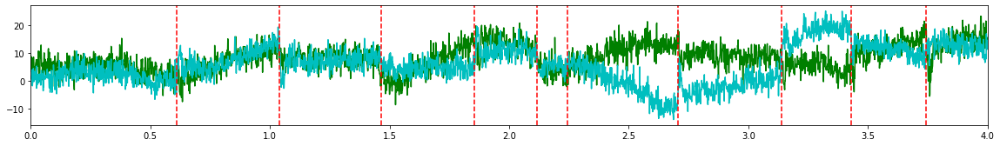

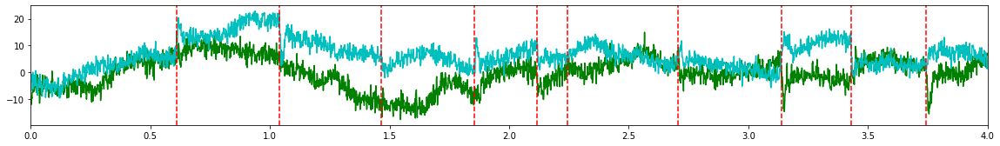

In [23]:
CU.trial_saccade_display(210, et1khzB, CsacsB, CampsB )

Amplitudes: [10.211243  10.4324665 17.946918   5.754258  26.440916  33.69179
  5.9584594 16.95646   22.553446   6.3915467]


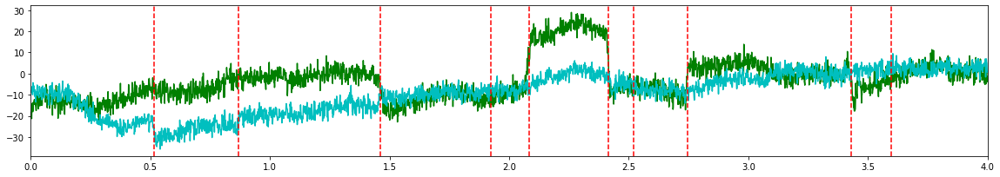

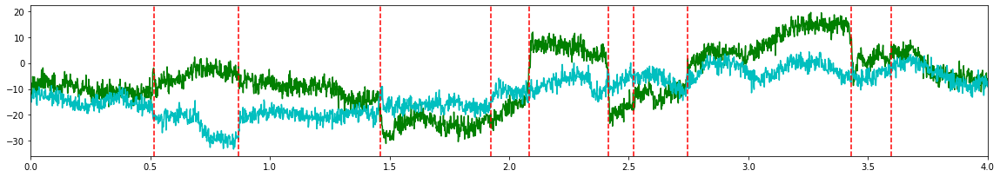

In [24]:
figgy = CU.trial_saccade_display(220, et1khzB, CsacsB, CampsB, fighandle=True, rh=3 )

In [21]:
#from NDNT.utils.DanUtils import figure_export
#figure_export( figgy[1], 'EyeLink_0722example222V.pdf' )
#figure_export( figgy[0], 'EyeLink_0722example222H.pdf' )

### Binocular segment process

In [25]:
ETtrace.shape, len(tB), len(tBhr)

((254160, 2), 154320, 2572000)

In [26]:
# Downsample to 120 Hz
ETprocB = np.zeros([len(tB), 4])
Ntr = et1khzB.shape[0]//4000
ts = np.arange(4000)
newts = np.arange(240)
for tr in range(Ntr):
    for dd in range(4):
        ETprocB[tr*240+newts, dd] = np.interp( newts/60, ts/1000, et1khzB[tr*4000+ts, dd] )

In [27]:
## Make amplitude threshold -- lets go up to 1.5 Hz
threshB = 6 #7.9  # 6 -> 0.1 deg
a = np.where(np.sqrt(CampsB) > threshB)[0]

Bsac_ts = CsacsB[a]  # time [bin] in ms

#sac_ts = deepcopy(CsacsB)  # integer times in ms
Bsacbins_all = np.floor(deepcopy(CsacsB)/1000*60).astype(int)  
Bsac_bins = Bsacbins_all[a] # Time [bin] in 60 Hz
Bsac_amps = CampsB[a]  # Amplistude
print("%d / %d saccades saved. %0.2f Hz"%(len(a), len(CampsB), len(a)*1000/len(tBhr)))

5443 / 6248 saccades saved. 2.12 Hz


### Monocular segment process

In [28]:
# Downsample to 120 Hz
ETprocL = np.zeros([len(tL), 2])

Ntr = et1khzL.shape[0]//4000
ts = np.arange(4000)
newts = np.arange(240)
for tr in range(Ntr):
    for dd in range(2):
        ETprocL[tr*240+newts, dd] = np.interp( newts/60, ts/1000, et1khzL[tr*4000+ts, dd] )

In [29]:
## Make amplitude threshold
threshL = 6 # 8.2  # 6 -> 0.1 deg
a = np.where(np.sqrt(CampsL) > threshL)[0]

Lsac_ts = CsacsL[a]  # time [bin] in ms

#sac_ts = deepcopy(CsacsB)  # integer times in ms
Lsacbins_all = np.floor(deepcopy(CsacsL)/1000*60).astype(int)  
Lsac_bins = Lsacbins_all[a] # Time [bin] in 60 Hz  <----- should be Rsacbins_all?>>>?
Lsac_amps = CampsL[a]  # Amplistude
print("%d / %d saccades saved. %0.2f Hz"%(len(a), len(CampsL), len(a)*1000/len(tLhr)))

2574 / 3478 saccades saved. 1.80 Hz


In [30]:
# Downsample to 120 Hz
ETprocR = np.zeros([len(tR), 2])

Ntr = et1khzR.shape[0]//4000
ts = np.arange(4000)
newts = np.arange(240)
for tr in range(Ntr):
    for dd in range(2):
        ETprocR[tr*240+newts, dd] = np.interp( newts/60, ts/1000, et1khzR[tr*4000+ts, dd] )

In [31]:
## Make amplitude threshold
threshR = 6 # 7.15  # 6 -> 0.1 deg
a = np.where(np.sqrt(CampsR) > threshR)[0]

Rsac_ts = CsacsR[a]  # time [bin] in ms

#sac_ts = deepcopy(CsacsB)  # integer times in ms
Rsacbins_all = np.floor(deepcopy(CsacsR)/1000*60).astype(int)  
Rsac_bins = Rsacbins_all[a] # Time [bin] in 60 Hz <----- should be Rsacbins_all?>>>?
Rsac_amps = CampsR[a]  # Amplistude
print("%d / %d saccades saved. %0.2f Hz"%(len(a), len(CampsR), len(a)*1000/len(tRhr)))

527 / 568 saccades saved. 2.27 Hz


In [32]:
# Append all saccade bins to single modified saccade bin list in order
print(tB[0], tB[-1])
print(tR[0], tR[-1])
print(tL[0], tL[-1])

0 154319
240240 254159
154320 240239


In [33]:
print(np.min(Bsac_bins), np.max(Bsac_bins))
print(np.min(Rsac_bins), np.max(Rsac_bins))
print(np.min(Lsac_bins), np.max(Lsac_bins))

19 154313
8 13892
14 85881


In [34]:
len(ETprocB), len(ETprocL)

(154320, 85920)

In [35]:
sac_bins_all = np.concatenate( (deepcopy(Bsac_bins), deepcopy(Rsac_bins)+tR[0], deepcopy(Lsac_bins)+tL[0]), axis=0 )

len(sac_bins_all), np.max(sac_bins_all),

(8544, 254132)

In [36]:
NT = ETprocB.shape[0] + ETprocL.shape[0] + ETprocR.shape[0]
ETproc_all = np.zeros( [NT,4], dtype=np.float32 )
ETproc_all[tB, :] = ETprocB

tmp = np.zeros( [ETprocR.shape[0], 4], dtype=np.float32 )
tmp[:, 2:] = ETprocR
ETproc_all[tR, :] = deepcopy(tmp)

tmp = np.zeros( [ETprocL.shape[0], 4], dtype=np.float32 )
tmp[:, :2] = ETprocL
ETproc_all[tL, :] = deepcopy(tmp)


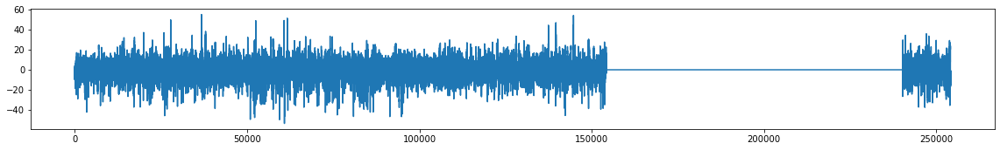

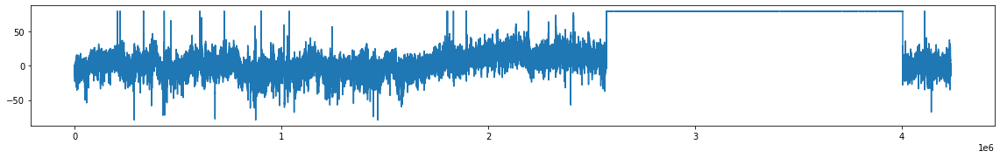

In [37]:
utils.ss()
plt.plot(ETproc_all[:,2])
plt.show()
utils.ss()
plt.plot(ETraw[:,2])
plt.show()

In [38]:
####### EXPORT ########
# sac_ts  ## microsaccade times in seconds (4 sec trials)
# sacbins # bin numbers of sac sampled at 60 Hz
# sac_amps ## squared magnitude
# Rsac_amps, Rsac_ts # reduced sac times & amplitude given threshold
# ETproc # downsampled processed eye trace
# et1khz # full sized et trace (1 kHz sample) -- processed

sio.savemat( datadir2+fn+'_ETupdate.mat', {
    'ALLsac_bins': sac_bins_all,  ## microsaccade times in seconds (4 sec trials)
    'et60Hz_all': ETproc_all, # bin numbers of sac sampled at 60 Hz

    'tsacs_msB': Bsac_ts,  ## microsaccade times in seconds (4 sec trials)
    'sac_bins_allB': Bsacbins_all, # bin numbers of sac sampled at 60 Hz
    'sac_amps_allB': CampsB, ## squared magnitude
    'sac_ampsB': Bsac_amps, # reduced sac times & amplitude given threshold
    'sac_binsB': Bsac_bins,
    'sac_tsB': Bsac_ts,
    'et60HzB': ETprocB, # downsampled processed eye trace
    'et1kHzB': et1khzB,

    'tsacs_msL': Lsac_ts,  ## microsaccade times in seconds (4 sec trials)
    'sac_bins_allL': Lsacbins_all, # bin numbers of sac sampled at 60 Hz
    'sac_amps_allL': CampsL, ## squared magnitude
    'sac_ampsL': Lsac_amps, # reduced sac times & amplitude given threshold
    'sac_binsL': Lsac_bins,
    'sac_tsL': Lsac_ts,
    'et60HzL': ETprocL, # downsampled processed eye trace
    'et1kHzL': et1khzL,

    'tsacs_msR': Rsac_ts,  ## microsaccade times in seconds (4 sec trials)
    'sac_bins_allR': Rsacbins_all, # bin numbers of sac sampled at 60 Hz
    'sac_amps_allR': CampsR, ## squared magnitude
    'sac_ampsR': Rsac_amps, # reduced sac times & amplitude given threshold
    'sac_binsR': Rsac_bins,
    'sac_tsR': Rsac_ts,
    'et60HzR': ETprocR, # downsampled processed eye trace
    'et1kHzR': et1khzR
} ) # full sized et trace (1 kHz sample) -- processed

# Data filter preprocess

Note that firing rates will change dramatically with the monocular sections, so apply data-filtering separately to each

In [39]:
import NTdatasets.conway.cloud_datasets as datasets

#num_lags = 10
inclMUs = True
data = datasets.ColorClouds(
    filenames=[fn0], datadir=datadir2, eye_config=0, drift_interval=16, 
    luminance_only=True, binocular=False, include_MUs=inclMUs)

NT = data.robs.shape[0]
print("%d (%d valid) time points"%(NT, len(data)))

NC = data.NC
print(NC,'cells')

SUs_lam = np.where(data.channel_mapSU < 32)[0]
MUs_lam = np.where(data.channel_mapMU < 32)[0]
print('Laminar probe units: %d SUs, %d MUs'%(len(SUs_lam), len(MUs_lam)) )
lam_units = np.where(data.channel_map < 32)[0]
ETunits = np.where(data.channel_map > 32)[0]
print( "%d laminar units, %d ET units"%(len(lam_units), len(ETunits)))
# default stimulus
data.assemble_stimulus(which_stim='et')
len(data.robs), len(tB)+len(tR)+len(tL)

Reducing stimulus channels (3) to first dimension
Loading data into memory...
Adjusting stimulus read from disk: mean | std = 0.000 | 0.269
T-range: 0 254160
254160 (254160 valid) time points
164 cells
Laminar probe units: 10 SUs, 7 MUs
17 laminar units, 147 ET units
Stim: using ET stimulus
  Adding fixation point
  Done


(254160, 254160)

In [40]:
# Figure out trials in each -- analyze separately
if Leyefirst:
    if Binocsplit:
        Btr = list(range(tB[0], (tR[0]-1)//240))+list(range((tL[-1]+1)//240, (tB[-1]+1)//240))
    else:
        Btr = range((tB[-1]+1)//240)
else: 
    if Binocsplit:
        Btr = list(range(tB[0], (tL[0]-1)//240))+list(range((tR[-1]+1)//240, (tB[-1]+1)//240))
    else:
        Btr = range((tB[-1]+1)//240)   
Rtr = range(tR[0]//240, (tR[-1]+1)//240)
Ltr = range(tL[0]//240, (tL[-1]+1)//240)

len(Btr), len(Ltr), len(Rtr), len(Btr) + len(Ltr) + len(Rtr) 

(643, 358, 58, 1059)

In [41]:
Ltr, Rtr, Btr[-1]

(range(643, 1001), range(1001, 1059), 642)

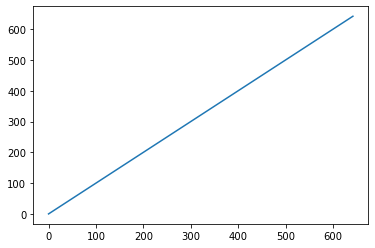

In [42]:
plt.plot(Btr)

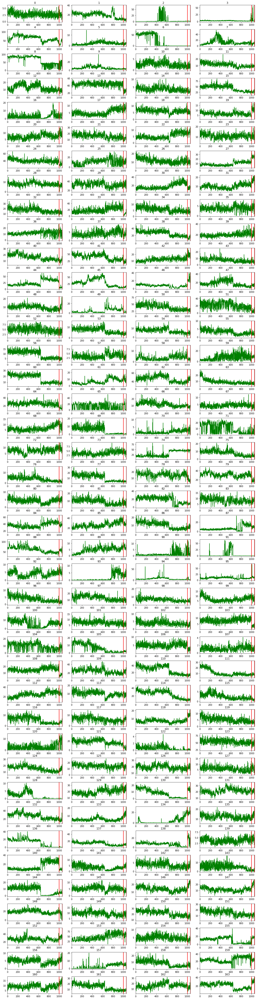

In [43]:
# Firing rate profiles and pruning
BLsize = 240
# data.cells_out = list(ETunits)  #already done earlier
NB = data.NT//BLsize
Ntrack = np.zeros([NB, NC])
for bb in range(NB):
    ts = np.arange(BLsize*bb, BLsize*(bb+1))
    Ntrack[bb, :] = 60*(torch.sum(
        data[ts]['dfs']*data[ts]['robs'],axis=0)/torch.sum(data[ts]['dfs'],axis=0).clamp(min=1)).detach().numpy()

nrows = int(np.ceil(NC/4))
utils.ss(nrows, 4, row_height=1.5)
for cc in range(NC):
    plt.subplot(nrows,4, cc+1)
    plt.plot(Ntrack[:,cc],'g')
    #plt.plot([0,NB],[0,0],'k')
    ys = plt.ylim()
#    plt.plot(Btr[-1]*np.ones(2), ys,'r')
    plt.plot(Rtr[0]*np.ones(2), ys,'r')
    plt.plot(Rtr[-1]*np.ones(2), ys,'r')
    plt.plot(Ltr[-1]*np.ones(2), ys,'r')
    plt.xlim([0, NB])
    plt.ylim(ys)
    plt.title("%d"%(cc))
plt.show()

### Binocular DFs

In [44]:
#val_units = []
DFtrial = np.zeros([NB, NC])
NB, len(Btr), len(Ltr), len(Rtr)

(1059, 643, 358, 58)

In [45]:
Ltr, Rtr, Btr[-1]

(range(643, 1001), range(1001, 1059), 642)

  Removing hole size=153
  Stability criteria not met: 0.19888734353268428


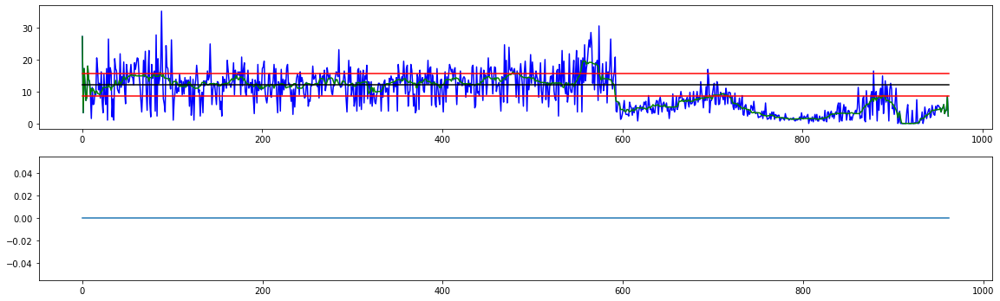

In [44]:
test = CU.firingrate_datafilter( Ntrack[Btr, 4], frac_reject=0.1, FRcut=2, verbose=True, to_plot=True )

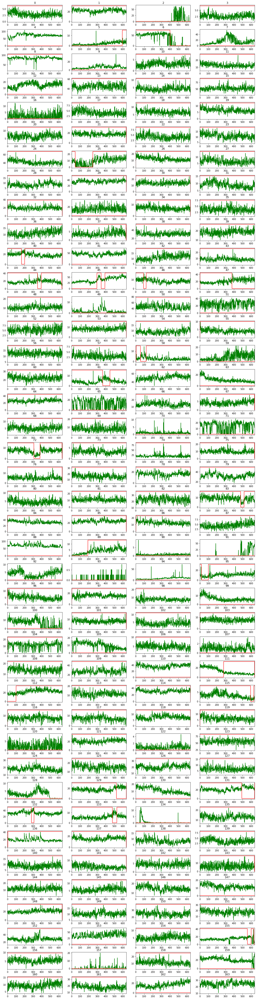

In [46]:
# Go through all units and eliminate or get trial-level data_filter
utils.ss(nrows, 4, row_height=1.5)
for cc in range(NC):
    #print(cc)
    DFtrial[Btr, cc] = CU.firingrate_datafilter( Ntrack[Btr, cc], frac_reject=0.1, FRcut=2.0, verbose=False )
    plt.subplot(nrows,4, cc+1)
    plt.plot(Ntrack[Btr,cc],'g')
    ys = plt.ylim()
    plt.plot(DFtrial[Btr, cc]*ys[1], 'r' )
    plt.xlim([0, Btr[-1]])
    #if np.sum(DFtrial[:, cc]) > 0:
    #    val_units.append(cc)
    plt.title("%d"%(cc))
plt.show()

#utils.imagesc(DFtrial[Btr,:])

In [47]:
# Modifications
DFtrial[Btr[100:], 4] = 1
DFtrial[Btr[300:], 5] = 1
DFtrial[Btr[200:500], 9] = 1
DFtrial[Btr[100:], 12] = 1
DFtrial[Btr, 33] = 1
DFtrial[Btr, 40] = 1
DFtrial[Btr, 41] = 1
DFtrial[Btr, 44] = 1
DFtrial[Btr[300:], 45] = 1
DFtrial[Btr, 47] = 1
DFtrial[Btr, 51] = 1
DFtrial[Btr[60:], 63] = 1
DFtrial[Btr, 88] = 1
DFtrial[Btr[100:], 99] = 1
DFtrial[Btr, 110] = 1
DFtrial[Btr, 111] = 1
DFtrial[Btr, 112] = 1
DFtrial[Btr, 129:133] = 1
DFtrial[Btr, 147] = 1
DFtrial[Btr, 153] = 1
DFtrial[Btr[:600], 159] = 1
DFtrial[Btr, 162] = 1


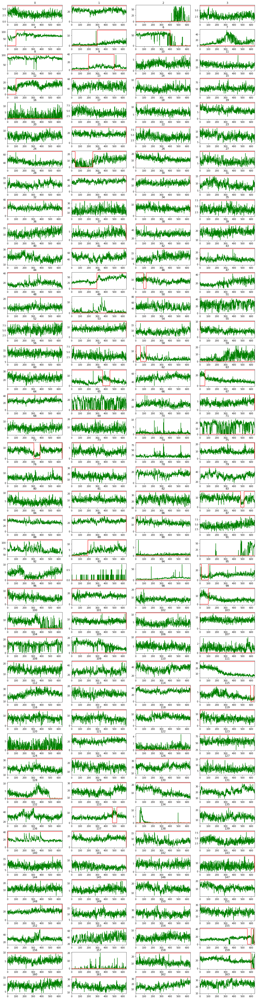

In [48]:
utils.ss(nrows, 4, row_height=1.5)
for cc in range(NC):
    #print(cc)
    plt.subplot(nrows,4, cc+1)
    plt.plot(Ntrack[Btr,cc],'g')
    ys = plt.ylim()
    plt.plot(DFtrial[Btr, cc]*ys[1], 'r' )
    plt.xlim([0, Btr[-1]])
    #if np.sum(DFtrial[:, cc]) > 0:
    #    val_units.append(cc)
    plt.title("%d"%(cc))
plt.show()

### Monocular DFs

/home/felixbartsch/anaconda3/envs/torch38/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/felixbartsch/anaconda3/envs/torch38/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


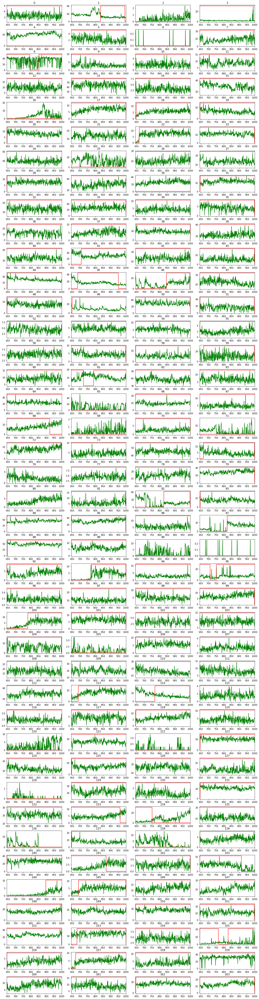

In [49]:
utils.ss(nrows, 4, row_height=1.5)
for cc in range(NC):
    #print(cc)
    DFtrial[Ltr, cc] = CU.firingrate_datafilter( Ntrack[Ltr, cc], frac_reject=0.2, verbose=False )
    plt.subplot(nrows,4, cc+1)
    plt.plot(Ltr, Ntrack[Ltr,cc],'g')
    ys = plt.ylim()
    plt.plot(Ltr, DFtrial[Ltr, cc]*ys[1], 'r' )
    plt.xlim([Ltr[0], Ltr[-1]])
    #if np.sum(DFtrial[:, cc]) > 0:
    #    val_units.append(cc)
    plt.title("%d"%(cc))
plt.show()

In [50]:
# Fixes -- L
DFtrial[Ltr[:120], 1] = 1
DFtrial[Ltr, 4] = 1
DFtrial[Ltr, 30] = 1
DFtrial[Ltr, 45] = 1
DFtrial[Ltr, 61] = 1
DFtrial[Ltr, 68] = 1
DFtrial[Ltr, 95] = 1
DFtrial[Ltr, 113] = 1
DFtrial[Ltr, 114] = 1
DFtrial[Ltr, 133] = 1
DFtrial[Ltr[200:], 141] = 0
DFtrial[Ltr, 153] = 1
DFtrial[Ltr[:300], 155] = 1


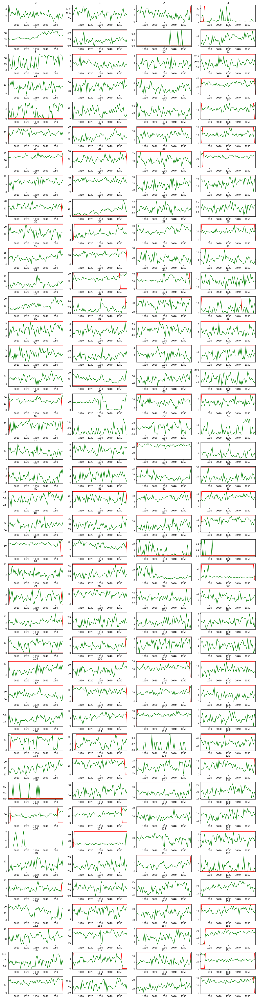

In [51]:
utils.ss(nrows, 4, row_height=1.5)
for cc in range(NC):
    #print(cc)
    DFtrial[Rtr, cc] = CU.firingrate_datafilter( Ntrack[Rtr, cc], frac_reject=0.2, verbose=False )
    plt.subplot(nrows,4, cc+1)
    plt.plot(Rtr, Ntrack[Rtr, cc],'g')
    ys = plt.ylim()
    plt.plot(Rtr, DFtrial[Rtr, cc]*ys[1], 'r' )
    plt.xlim([Rtr[0], Rtr[-1]])
    #if np.sum(DFtrial[:, cc]) > 0:
    #    val_units.append(cc)
    plt.title("%d"%(cc))
plt.show()

In [52]:
## Rtr corrections
DFtrial[Rtr, 4] = 1
DFtrial[Rtr, 38] = 1
DFtrial[Rtr, 45] = 1
DFtrial[Rtr, 46] = 1
DFtrial[Rtr, 61] = 1
DFtrial[Rtr[20:], 94] = 1


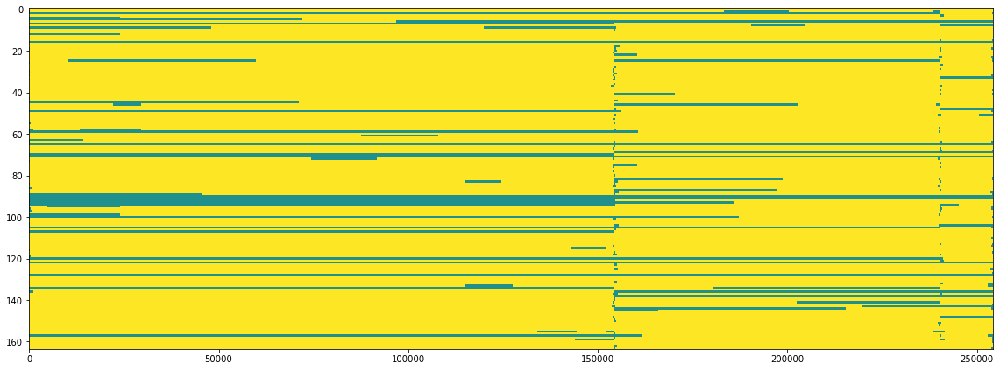

In [53]:
XDF = CU.DFexpand( DFtrial, data.NT )
utils.ss(row_height=6)
utils.imagesc(XDF)

In [54]:
fn0

'J220711_CC_CC_v08'

In [55]:
sio.savemat(datadir2+fn+'_DFupdate.mat', {'XDF': XDF})

In [ ]:
lam_units = np.where(data.channel_map < 32)[0]
NFunits = np.where((data.channel_map > 32) & (data.channel_map < (32+128)))[0]
UTunits = np.where(data.channel_map >= 32+127)[0]

In [ ]:
# set Robs inclusion criteria
data.dfs = torch.tensor( XDF[:NT, :], dtype=torch.float32 )

Reff = torch.mul(data.robs[:, UTunits], data.dfs[:, UTunits]).numpy()
nspks = np.sum(Reff, axis=0)
a = np.where(nspks > 10)[0]
valUT = UTunits[a]
NCUT = len(valUT)

Reff = torch.mul(data.robs[:, NFunits], data.dfs[:, NFunits]).numpy()
nspks = np.sum(Reff, axis=0)
a = np.where(nspks > 10)[0]
valNF = NFunits[a]
NCNF = len(valNF)

Reff = torch.mul(data.robs[:, lam_units], data.dfs[:, lam_units]).numpy()
nspks = np.sum(Reff, axis=0)
a = np.where(nspks > 10)[0]
valLP = lam_units[a]
NCL = len(valLP)